## References

- https://apple.github.io/turicreate/docs/userguide/
- https://apple.github.io/turicreate/docs/userguide/recommender/
- https://apple.github.io/turicreate/docs/userguide/sframe/sframe-intro.html
- https://apple.github.io/turicreate/docs/userguide/vis/gallery.html
- https://apple.github.io/turicreate/docs/userguide/image_classifier/

In [1]:
import turicreate as tc
import pandas as pd
import numpy as np #test

## Read

In [10]:
%%time
df = tc.SFrame.read_csv('data/data_1gb.csv')
df.head()

Finished parsing file /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/data_1gb.csv

Parsing completed. Parsed 100 lines in 0.428194 secs.

------------------------------------------------------
Inferred types from first 100 line(s) of file as 
column_type_hints=[int,str,int]
If parsing fails due to incorrect types, you can correct
the inferred type list above and pass it to read_csv in
the column_type_hints argument
------------------------------------------------------


Read 1631853 lines. Lines per second: 2.74847e+06

Finished parsing file /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/data_1gb.csv

Parsing completed. Parsed 31486163 lines in 5.01278 secs.

CPU times: user 22.4 s, sys: 555 ms, total: 22.9 s
Wall time: 5.87 s


mno_ms_id,pos_time,mno_cell_id
617487,2019-01-01 17:06:30,11891
617487,2019-01-01 07:01:44,9810
617487,2019-01-01 14:14:09,7534
617487,2019-01-01 11:51:41,545
617487,2019-01-01 07:23:54,9752
617487,2019-01-01 21:46:06,9969
617487,2019-01-01 12:52:57,14310
617487,2019-01-01 22:10:05,11759
617487,2019-01-01 03:03:08,1206
617487,2019-01-01 09:23:31,1314


In [9]:
%%time
df_pd = pd.read_csv('data/data_1gb.csv')
df_pd.head()

CPU times: user 10 s, sys: 764 ms, total: 10.8 s
Wall time: 10.8 s


,mno_ms_id,pos_time,mno_cell_id
0,617487,2019-01-01 17:06:30,11891
1,617487,2019-01-01 07:01:44,9810
2,617487,2019-01-01 14:14:09,7534
3,617487,2019-01-01 11:51:41,545
4,617487,2019-01-01 07:23:54,9752


## Write

In [11]:
%%time
df.export_csv('output/sframe_1gb.csv')

CPU times: user 43.8 s, sys: 409 ms, total: 44.2 s
Wall time: 44.2 s


In [12]:
%%time
df_pd.to_csv('output/df_pd_1gb.csv')

CPU times: user 46.6 s, sys: 784 ms, total: 47.4 s
Wall time: 47.5 s


## Recommender System

In [13]:
import turicreate as tc
actions = tc.SFrame.read_csv('data/ml-20m/ratings.csv')

Finished parsing file /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/ml-20m/ratings.csv

Parsing completed. Parsed 100 lines in 0.418112 secs.

------------------------------------------------------
Inferred types from first 100 line(s) of file as 
column_type_hints=[int,int,float,int]
If parsing fails due to incorrect types, you can correct
the inferred type list above and pass it to read_csv in
the column_type_hints argument
------------------------------------------------------


Read 2042753 lines. Lines per second: 3.40995e+06

Finished parsing file /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/ml-20m/ratings.csv

Parsing completed. Parsed 20000263 lines in 2.85114 secs.

In [15]:
items = tc.SFrame.read_csv('data/ml-20m/movies.csv')

Finished parsing file /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/ml-20m/movies.csv

Parsing completed. Parsed 100 lines in 0.027626 secs.

------------------------------------------------------
Inferred types from first 100 line(s) of file as 
column_type_hints=[int,str,str]
If parsing fails due to incorrect types, you can correct
the inferred type list above and pass it to read_csv in
the column_type_hints argument
------------------------------------------------------


Finished parsing file /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/ml-20m/movies.csv

Parsing completed. Parsed 27278 lines in 0.02771 secs.

In [16]:
## creating a model
training_data, validation_data = tc.recommender.util.random_split_by_user(actions, 'userId', 'movieId')
model = tc.recommender.create(training_data, 'userId', 'movieId')

Warning: Ignoring columns rating, timestamp;

To use one of these as a rating column, specify the column name to be used as target

and use a method that allows the use of a target.

Preparing data set.

Data has 19970212 observations with 138493 users and 26657 items.

Data prepared in: 4.14017s

Training model from provided data.

Gathering per-item and per-user statistics.

+--------------------------------+------------+

| Elapsed Time (Item Statistics) | % Complete |

+--------------------------------+------------+

| 4.41ms                         | 0.5        |

| 122.633ms                      | 100        |

+--------------------------------+------------+

Setting up lookup tables.

Processing data in one pass using dense lookup tables.

+-------------------------------------+------------------+-----------------+

| Elapsed Time (Constructing Lookups) | Total % Complete | Items Processed |

+-------------------------------------+------------------+-----------------+

| 871.145ms                           | 0                | 0               |

| 3.87s                               | 17.75            | 4790            |

| 6.87s                               | 35.5             | 9507            |

| 9.87s                               | 53               | 14182           |

| 12.87s                              | 70.5             | 18810           |

| 15.87s                              | 87.75            | 23403           |

| 20.05s                              | 100              | 26657           |

+-------------------------------------+------------------+-----------------+

Finalizing lookup tables.

Generating candidate set for working with new users.

Finished training in 21.3549s

In [17]:
results = model.recommend()

recommendations finished on 1000/138493 queries. users per second: 21199.5

recommendations finished on 2000/138493 queries. users per second: 21284.5

recommendations finished on 3000/138493 queries. users per second: 21093.2

recommendations finished on 4000/138493 queries. users per second: 20924.6

recommendations finished on 5000/138493 queries. users per second: 20855.8

recommendations finished on 6000/138493 queries. users per second: 20806.7

recommendations finished on 7000/138493 queries. users per second: 20868.9

recommendations finished on 8000/138493 queries. users per second: 20770.4

recommendations finished on 9000/138493 queries. users per second: 20790.2

recommendations finished on 10000/138493 queries. users per second: 20826.7

recommendations finished on 11000/138493 queries. users per second: 20811.6

recommendations finished on 12000/138493 queries. users per second: 20780.1

recommendations finished on 13000/138493 queries. users per second: 20764.2

recommendations finished on 14000/138493 queries. users per second: 20651.7

recommendations finished on 15000/138493 queries. users per second: 20521.5

recommendations finished on 16000/138493 queries. users per second: 20524.7

recommendations finished on 17000/138493 queries. users per second: 20527.8

recommendations finished on 18000/138493 queries. users per second: 20545.6

recommendations finished on 19000/138493 queries. users per second: 20476.3

recommendations finished on 20000/138493 queries. users per second: 20483.5

recommendations finished on 21000/138493 queries. users per second: 20484.1

recommendations finished on 22000/138493 queries. users per second: 20481.5

recommendations finished on 23000/138493 queries. users per second: 20484.5

recommendations finished on 24000/138493 queries. users per second: 20479.6

recommendations finished on 25000/138493 queries. users per second: 20489.8

recommendations finished on 26000/138493 queries. users per second: 20492.7

recommendations finished on 27000/138493 queries. users per second: 20502.6

recommendations finished on 28000/138493 queries. users per second: 20527.3

recommendations finished on 29000/138493 queries. users per second: 20515.2

recommendations finished on 30000/138493 queries. users per second: 20520.2

recommendations finished on 31000/138493 queries. users per second: 20533.2

recommendations finished on 32000/138493 queries. users per second: 20536.1

recommendations finished on 33000/138493 queries. users per second: 20547.7

recommendations finished on 34000/138493 queries. users per second: 20551.8

recommendations finished on 35000/138493 queries. users per second: 20563.4

recommendations finished on 36000/138493 queries. users per second: 20573.8

recommendations finished on 37000/138493 queries. users per second: 20581.6

recommendations finished on 38000/138493 queries. users per second: 20592.8

recommendations finished on 39000/138493 queries. users per second: 20598

recommendations finished on 40000/138493 queries. users per second: 20590.6

recommendations finished on 41000/138493 queries. users per second: 20591.8

recommendations finished on 42000/138493 queries. users per second: 20590.5

recommendations finished on 43000/138493 queries. users per second: 20593.5

recommendations finished on 44000/138493 queries. users per second: 20587.5

recommendations finished on 45000/138493 queries. users per second: 20586.9

recommendations finished on 46000/138493 queries. users per second: 20594

recommendations finished on 47000/138493 queries. users per second: 20602.2

recommendations finished on 48000/138493 queries. users per second: 20596.9

recommendations finished on 49000/138493 queries. users per second: 20599

recommendations finished on 50000/138493 queries. users per second: 20601.9

recommendations finished on 51000/138493 queries. users per second: 20611.6

recommendations finished on 52000/138493 queries. users per second: 20594.9

recommendations finished on 53000/138493 queries. users per second: 20592

recommendations finished on 54000/138493 queries. users per second: 20597

recommendations finished on 55000/138493 queries. users per second: 20576.9

recommendations finished on 56000/138493 queries. users per second: 20552.2

recommendations finished on 57000/138493 queries. users per second: 20557.5

recommendations finished on 58000/138493 queries. users per second: 20561.3

recommendations finished on 59000/138493 queries. users per second: 20569.3

recommendations finished on 60000/138493 queries. users per second: 20569.9

recommendations finished on 61000/138493 queries. users per second: 20565.5

recommendations finished on 62000/138493 queries. users per second: 20571.6

recommendations finished on 63000/138493 queries. users per second: 20576.6

recommendations finished on 64000/138493 queries. users per second: 20576.8

recommendations finished on 65000/138493 queries. users per second: 20576

recommendations finished on 66000/138493 queries. users per second: 20569.2

recommendations finished on 67000/138493 queries. users per second: 20569.1

recommendations finished on 68000/138493 queries. users per second: 20573.8

recommendations finished on 69000/138493 queries. users per second: 20570.3

recommendations finished on 70000/138493 queries. users per second: 20571.1

recommendations finished on 71000/138493 queries. users per second: 20574

recommendations finished on 72000/138493 queries. users per second: 20577.6

recommendations finished on 73000/138493 queries. users per second: 20579

recommendations finished on 74000/138493 queries. users per second: 20579.6

recommendations finished on 75000/138493 queries. users per second: 20585.3

recommendations finished on 76000/138493 queries. users per second: 20585.8

recommendations finished on 77000/138493 queries. users per second: 20589.3

recommendations finished on 78000/138493 queries. users per second: 20586.4

recommendations finished on 79000/138493 queries. users per second: 20586.3

recommendations finished on 80000/138493 queries. users per second: 20582.2

recommendations finished on 81000/138493 queries. users per second: 20578.7

recommendations finished on 82000/138493 queries. users per second: 20577.7

recommendations finished on 83000/138493 queries. users per second: 20578.7

recommendations finished on 84000/138493 queries. users per second: 20582.3

recommendations finished on 85000/138493 queries. users per second: 20586.8

recommendations finished on 86000/138493 queries. users per second: 20587.4

recommendations finished on 87000/138493 queries. users per second: 20589.9

recommendations finished on 88000/138493 queries. users per second: 20586.9

recommendations finished on 89000/138493 queries. users per second: 20589.9

recommendations finished on 90000/138493 queries. users per second: 20590.6

recommendations finished on 91000/138493 queries. users per second: 20589.5

recommendations finished on 92000/138493 queries. users per second: 20590.1

recommendations finished on 93000/138493 queries. users per second: 20585.5

recommendations finished on 94000/138493 queries. users per second: 20568.5

recommendations finished on 95000/138493 queries. users per second: 20561.6

recommendations finished on 96000/138493 queries. users per second: 20536.7

recommendations finished on 97000/138493 queries. users per second: 20496.6

recommendations finished on 98000/138493 queries. users per second: 20488.3

recommendations finished on 99000/138493 queries. users per second: 20491.8

recommendations finished on 100000/138493 queries. users per second: 20497.1

recommendations finished on 101000/138493 queries. users per second: 20503.1

recommendations finished on 102000/138493 queries. users per second: 20504

recommendations finished on 103000/138493 queries. users per second: 20501.3

recommendations finished on 104000/138493 queries. users per second: 20507.7

recommendations finished on 105000/138493 queries. users per second: 20511.3

recommendations finished on 106000/138493 queries. users per second: 20510

recommendations finished on 107000/138493 queries. users per second: 20506.7

recommendations finished on 108000/138493 queries. users per second: 20507.1

recommendations finished on 109000/138493 queries. users per second: 20508.3

recommendations finished on 110000/138493 queries. users per second: 20511.9

recommendations finished on 111000/138493 queries. users per second: 20511.2

recommendations finished on 112000/138493 queries. users per second: 20513.9

recommendations finished on 113000/138493 queries. users per second: 20513.9

recommendations finished on 114000/138493 queries. users per second: 20515.8

recommendations finished on 115000/138493 queries. users per second: 20510.9

recommendations finished on 116000/138493 queries. users per second: 20511.3

recommendations finished on 117000/138493 queries. users per second: 20509.9

recommendations finished on 118000/138493 queries. users per second: 20513.7

recommendations finished on 119000/138493 queries. users per second: 20516

recommendations finished on 120000/138493 queries. users per second: 20522.9

recommendations finished on 121000/138493 queries. users per second: 20521.1

recommendations finished on 122000/138493 queries. users per second: 20523.2

recommendations finished on 123000/138493 queries. users per second: 20524

recommendations finished on 124000/138493 queries. users per second: 20526.3

recommendations finished on 125000/138493 queries. users per second: 20527.3

recommendations finished on 126000/138493 queries. users per second: 20528.9

recommendations finished on 127000/138493 queries. users per second: 20531.8

recommendations finished on 128000/138493 queries. users per second: 20532.1

recommendations finished on 129000/138493 queries. users per second: 20535.7

recommendations finished on 130000/138493 queries. users per second: 20538.5

recommendations finished on 131000/138493 queries. users per second: 20540.3

recommendations finished on 132000/138493 queries. users per second: 20541.1

recommendations finished on 133000/138493 queries. users per second: 20540.5

recommendations finished on 134000/138493 queries. users per second: 20540.5

recommendations finished on 135000/138493 queries. users per second: 20545.3

recommendations finished on 136000/138493 queries. users per second: 20550.3

recommendations finished on 137000/138493 queries. users per second: 20542

recommendations finished on 138000/138493 queries. users per second: 20501.1

In [20]:
data = tc.SFrame({'user_id': ["Ann", "Ann", "Ann", "Brian", "Brian", "Brian"],
                          'item_id': ["Item1", "Item2", "Item4", "Item2", "Item3", "Item5"],
                          'rating': [1, 3, 2, 5, 4, 2]})
m = tc.factorization_recommender.create(data, target='rating')

recommendations = m.recommend()

Preparing data set.

Data has 6 observations with 2 users and 5 items.

Data prepared in: 0.001437s

Training factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 8        |

| regularization                 | L2 Regularization on Factors                     | 1e-08    |

| solver                         | Solver used for training                         | sgd      |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-10    |

| max_iterations                 | Maximum Number of Iterations                     | 50       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 6 / 6 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 25                | Not Viable                               |

| 1       | 6.25              | Not Viable                               |

| 2       | 1.5625            | 0.359933                                 |

| 3       | 0.78125           | 0.0270605                                |

| 4       | 0.390625          | 0.0215768                                |

| 5       | 0.195312          | 0.0553155                                |

+---------+-------------------+------------------------------------------+

| Final   | 0.390625          | 0.0215768                                |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 28us         | 1.80549           | 1.34368               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 317us        | 2.12573           | 1.45799               | 0.390625    |

| 2       | 510us        | 0.186971          | 0.432401              | 0.232267    |

| 3       | 745us        | 0.0549676         | 0.234452              | 0.171364    |

| 4       | 937us        | 0.0283667         | 0.168424              | 0.116134    |

| 5       | 1.119ms      | 0.0237795         | 0.154206              | 0.098237    |

| 10      | 1.928ms      | 0.012322          | 0.111004              | 0.0584121   |

| 50      | 7.548ms      | 0.00275147        | 0.0524545             | 0.0174693   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.00253916

Final training RMSE: 0.0503901

In [22]:
recommendations = m.recommend(users=['Brian'])
recommendations

user_id,item_id,score,rank
Brian,Item4,3.81624943514665,1
Brian,Item1,2.816278060277303,2


## Text Classifier

In [24]:
import turicreate as tc

# Only load the first two columns from csv
data = tc.SFrame.read_csv('data/classifier = model.classifierSMSSpamCollection', header=False, delimiter='\t', quote_char='\0')

# Rename the columns
data = data.rename({'X1': 'label', 'X2': 'text'})

# Split the data into training and testing
training_data, test_data = data.random_split(0.8)

# Create a model using higher max_iterations than default
model = tc.text_classifier.create(training_data, 'label', features=['text'], max_iterations=100)

# Save predictions to an SArray
predictions = model.predict(test_data)

# Make evaluation the model
metrics = model.evaluate(test_data)
print(metrics['accuracy'])

# Save the model for later use in Turi Create
model.save('MyTextMessageClassifier.model')

# Export for use in Core ML
model.export_coreml('MyTextMessageClassifier.mlmodel')

Finished parsing file /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/SMSSpamCollection

Parsing completed. Parsed 100 lines in 0.019001 secs.

------------------------------------------------------
Inferred types from first 100 line(s) of file as 
column_type_hints=[str,str]
If parsing fails due to incorrect types, you can correct
the inferred type list above and pass it to read_csv in
the column_type_hints argument
------------------------------------------------------


Finished parsing file /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/SMSSpamCollection

Parsing completed. Parsed 5574 lines in 0.019443 secs.

PROGRESS: Creating a validation set from 5 percent of training data. This may take a while.
          You can set ``validation_set=None`` to disable validation tracking.



Logistic regression:

--------------------------------------------------------

Number of examples          : 4240

Number of classes           : 2

Number of feature columns   : 1

Number of unpacked features : 3412

Number of coefficients      : 3413

Starting L-BFGS

--------------------------------------------------------

+-----------+----------+-----------+--------------+-------------------+---------------------+

| Iteration | Passes   | Step size | Elapsed Time | Training Accuracy | Validation Accuracy |

+-----------+----------+-----------+--------------+-------------------+---------------------+

| 0         | 2        | 1.000000  | 0.011912     | 0.987972          | 0.955357            |

| 1         | 4        | 1.000000  | 0.018493     | 0.992689          | 0.950893            |

| 2         | 6        | 1.000000  | 0.025079     | 0.996934          | 0.946429            |

| 3         | 7        | 1.000000  | 0.029513     | 0.998113          | 0.941964            |

| 4         | 8        | 1.000000  | 0.034046     | 0.998585          | 0.941964            |

| 9         | 18       | 0.607627  | 0.066874     | 0.999764          | 0.946429            |

| 43        | 67       | 1.000000  | 0.250741     | 1.000000          | 0.946429            |

+-----------+----------+-----------+--------------+-------------------+---------------------+

0.9747747747747748


In [25]:
classifier = model.classifier

In [26]:
model.export_coreml('MyTextMessageClassifier.mlmodel')

## Visualization

In [27]:
import turicreate as tc

df_viz = tc.SFrame.read_csv('data/cell.csv')
df_viz.show()

Finished parsing file /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/cell.csv

Parsing completed. Parsed 100 lines in 0.021331 secs.

------------------------------------------------------
Inferred types from first 100 line(s) of file as 
column_type_hints=[int,int]
If parsing fails due to incorrect types, you can correct
the inferred type list above and pass it to read_csv in
the column_type_hints argument
------------------------------------------------------


Finished parsing file /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/cell.csv

Parsing completed. Parsed 13295 lines in 0.020115 secs.

Materializing SFrame

In [29]:
df_viz.explore()

/home/developer/miniconda3/lib/python3.8/site-packages/turicreate/visualization/_plot.py:461: UserWarning: Displaying only the first 100 rows.
  warnings.warn("Displaying only the first {} rows.".format(maximum_rows))


,cell_id,mno_cell_id
0,1,1
1,10,10
2,100,100
3,1000,1000
4,9516,10000
5,9517,10001
6,9518,10002
7,9519,10003
8,9520,10004
9,9521,10005


In [30]:
sf = tc.SFrame.read_csv('https://docs-assets.developer.apple.com/turicreate/datasets/tc-clang-format-results.csv')
sf.explore()

Downloading https://docs-assets.developer.apple.com/turicreate/datasets/tc-clang-format-results.csv to /var/tmp/turicreate-developer/23924/84b45090-4ed5-4628-bbf2-be18fca3ac7b.csv

Finished parsing file https://docs-assets.developer.apple.com/turicreate/datasets/tc-clang-format-results.csv

Parsing completed. Parsed 100 lines in 0.03984 secs.

------------------------------------------------------
Inferred types from first 100 line(s) of file as 
column_type_hints=[int,int,str,int,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str]
If parsing fails due to incorrect types, you can correct
the inferred type list above and pass it to read_csv in
the column_type_hints argument
------------------------------------------------------


Finished parsing file https://docs-assets.developer.apple.com/turicreate/datasets/tc-clang-format-results.csv

Parsing completed. Parsed 10000 lines in 0.0332 secs.

/home/developer/miniconda3/lib/python3.8/site-packages/turicreate/visualization/_plot.py:461: UserWarning: Displaying only the first 100 rows.
  warnings.warn("Displaying only the first {} rows.".format(maximum_rows))


,Lines Added,Lines Removed,File Path,Config.AccessModifierOffset,Config.AlignAfterOpenBracket,Config.AlignConsecutiveAssignments,Config.AlignConsecutiveDeclarations,Config.AlignEscapedNewlines,Config.AlignOperands,Config.AlignTrailingComments,Config.AllowAllParametersOfDeclarationOnNextLine,Config.AllowShortBlocksOnASingleLine,Config.AllowShortCaseLabelsOnASingleLine,Config.AllowShortFunctionsOnASingleLine,Config.AllowShortIfStatementsOnASingleLine,Config.AllowShortLoopsOnASingleLine,Config.AlwaysBreakAfterDefinitionReturnType,Config.AlwaysBreakAfterReturnType,Config.AlwaysBreakBeforeMultilineStrings,Config.AlwaysBreakTemplateDeclarations,Config.BasedOnStyle,Config.BinPackArguments,Config.BinPackParameters
0,530,534,toolkits/graph_analytics/sssp_sgraph.cpp,0,Align,true,true,DontAlign,false,true,false,false,true,Empty,false,false,TopLevel,None,false,true,WebKit,true,false
1,46,55,toolkits/coreml_export/MLModel/src/ArrayFeatureExtractorValidator.cpp,4,AlwaysBreak,false,false,Left,false,true,true,true,true,All,false,false,All,TopLevel,true,true,WebKit,true,true
2,15,13,toolkits/ml_data_2/iterators/ml_data_iterator.hpp,4,AlwaysBreak,false,true,Right,true,true,true,false,false,None,false,false,All,TopLevelDefinitions,true,false,Chromium,false,false
3,171,125,toolkits/coreml_export/MLModel/build/format/Scaler.pb.cc,6,DontAlign,false,false,DontAlign,true,true,false,true,false,InlineOnly,true,true,All,TopLevel,true,false,LLVM,false,true
4,54,64,toolkits/clustering/kmeans.hpp,4,DontAlign,true,true,Right,true,true,false,true,false,InlineOnly,true,true,None,TopLevel,true,false,LLVM,true,true
5,68,63,toolkits/coreml_export/MLModel/src/transforms/NeuralNetwork.hpp,8,DontAlign,false,true,Right,false,true,false,false,false,Empty,false,true,None,AllDefinitions,true,true,Mozilla,false,true
6,58,54,toolkits/coreml_export/MLModel/src/Utils.hpp,4,Align,false,false,Right,true,true,false,false,true,Inline,true,false,None,All,false,true,Chromium,false,false
7,120,133,lib/variant_deep_serialize.cpp,8,DontAlign,true,true,Left,false,true,true,false,true,InlineOnly,true,false,All,TopLevel,false,true,WebKit,true,true
8,67,60,toolkits/ml_data_2/statistics/column_statistics.cpp,8,DontAlign,true,false,Right,false,true,true,true,true,None,true,false,All,All,true,false,WebKit,true,true
9,119,75,lib/gl_sgraph.cpp,2,DontAlign,false,true,Left,true,false,true,true,false,Inline,false,false,TopLevel,TopLevelDefinitions,true,false,Google,true,true


## Image Classification

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/10073.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/10125.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/10404.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/10501.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/10820.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/10874.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/11083.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/11086.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/11095.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/11210.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/11397.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/1151.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/11565.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/11729.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/11864.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/11874.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/11935.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/12080.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/12235.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/12269.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/1267.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/1386.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/140.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/1757.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/1914.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/1936.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/1937.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/2021.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/2189.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/23.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/2569.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/2663.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/2742.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/3153.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/3161.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/3197.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/3300.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/3491.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/3649.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/3710.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/391.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/3967.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/4000.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/4293.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/4322.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/4334.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/4351.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/445.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/4629.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/4750.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/4821.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/4833.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/4874.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/4929.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/5077.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/5370.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/5553.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/5614.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/5819.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/6029.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/6376.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/6435.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/6486.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/6491.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/660.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/666.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/6768.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/6900.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/6906.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/6980.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/7003.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/7502.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/7642.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/7647.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/7845.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/7968.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/7978.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/8183.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/8295.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/8415.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/8470.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/850.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/8553.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/8832.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/8958.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/910.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/9100.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/9171.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/9208.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/9328.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/936.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/9361.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/9565.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/9619.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/9778.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/10158.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/1017.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/10173.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/10351.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/10353.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/10383.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/10401.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/10637.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/10678.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/10705.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/10726.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/10733.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/10747.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/10797.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/10863.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/10907.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/10969.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/10972.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/11166.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/11233.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/11253.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/11285.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/11410.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/11560.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/11590.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/11675.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/1168.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/11692.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/11702.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/11849.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/11853.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/11912.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/12102.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/12114.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/12289.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/1259.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/1308.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/1356.jpg

Unsupported colorspace format. Currently, only RGB and Grayscale are supported.	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/1789.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/1866.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/1884.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/1900.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/2317.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/2353.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/2384.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/2479.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/2494.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/2688.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/2877.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/2905.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/2915.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/296.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/3038.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/3136.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/3155.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/3288.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/3320.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/3546.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/3588.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/3885.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/3927.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/4086.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/4134.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/414.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/4203.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/4257.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/4301.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/4367.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/4640.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/4654.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/4924.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/50.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/5104.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/522.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/5243.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/5263.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/543.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/5547.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/5604.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/561.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/5618.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/565.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/573.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/5730.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/5736.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/5790.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/5955.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/6032.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/6059.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/6213.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/6238.jpg

Unsupported colorspace format. Currently, only RGB and Grayscale are supported.	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/6245.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/6305.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/6318.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/6430.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/6500.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/6503.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/6555.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/663.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/6718.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/6855.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/7112.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/7128.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/7133.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/719.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/7311.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/7369.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/7459.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/7514.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/7652.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/7718.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/7739.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/7743.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/7969.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/8126.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/8194.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/8364.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/8521.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/8557.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/8563.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/8641.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/8693.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/8715.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/8730.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/8889.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/9026.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/9043.jpg

Unsupported colorspace format. Currently, only RGB and Grayscale are supported.	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/9078.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/9145.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/9188.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/9367.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/9414.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/9500.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/9556.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/9640.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/9643.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/9851.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/9961.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/9967.jpg

/home/developer/miniconda3/lib/python3.8/site-packages/turicreate/visualization/_plot.py:461: UserWarning: Displaying only the first 100 rows.
  warnings.warn("Displaying only the first {} rows.".format(maximum_rows))


,path,image,label
0,/data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/0.jpg,,cat
1,/data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/1.jpg,,cat
2,/data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/10.jpg,,cat
3,/data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/100.jpg,,cat
4,/data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/1000.jpg,,cat
5,/data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/10000.jpg,,cat
6,/data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/10001.jpg,,cat
7,/data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/10002.jpg,,cat
8,/data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/10003.jpg,,cat
9,/data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/10004.jpg,,cat

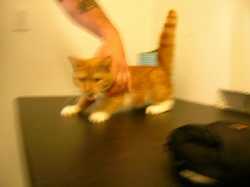
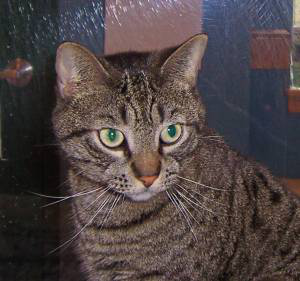
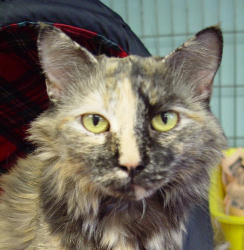
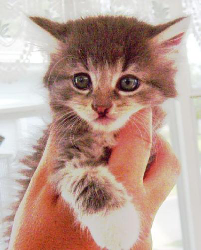
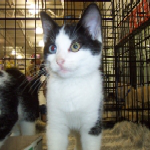
...
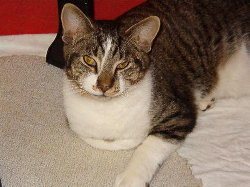
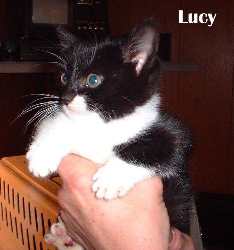
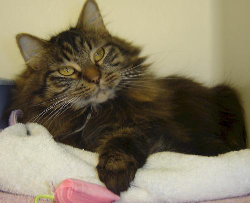
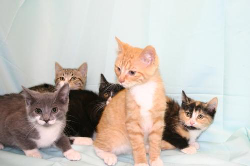
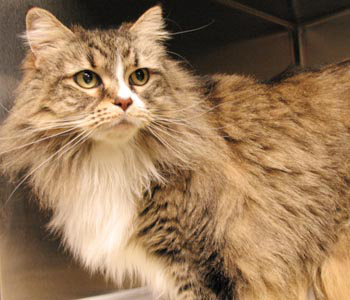

In [32]:
import turicreate as tc

# Load images (Note:'Not a JPEG file' errors are warnings, meaning those files will be skipped)
data = tc.image_analysis.load_images('data/PetImages', with_path=True)

# From the path-name, create a label column
data['label'] = data['path'].apply(lambda path: 'dog' if '/Dog' in path else 'cat')

# Save the data for future use
data.save('cats-dogs.sframe')

# Explore interactively
data.explore()

In [33]:
import turicreate as tc

# Load the data
data =  tc.SFrame('cats-dogs.sframe')

# Make a train-test split
train_data, test_data = data.random_split(0.8)

# Create the model
model = tc.image_classifier.create(train_data, target='label')

# Save predictions to an SArray
predictions = model.predict(test_data)

# Evaluate the model and print the results
metrics = model.evaluate(test_data)
print(metrics['accuracy'])

# Save the model for later use in Turi Create
model.save('cats-dogs.model')

# Export for use in Core ML
model.export_coreml('MyCustomImageClassifier.mlmodel')

Download completed: /var/tmp/model_cache/resnet-50-TuriCreate-6.0.h5
Performing feature extraction on resized images...
Completed    64/19838
Completed   128/19838
Completed   192/19838
Completed   256/19838
Completed   320/19838
Completed   384/19838
Completed   448/19838
Completed   512/19838
Completed   576/19838
Completed   640/19838
Completed   704/19838
Completed   768/19838
Completed   832/19838
Completed   896/19838
Completed   960/19838
Completed  1024/19838
Completed  1088/19838
Completed  1152/19838
Completed  1216/19838
Completed  1280/19838
Completed  1344/19838
Completed  1408/19838
Completed  1472/19838
Completed  1536/19838
Completed  1600/19838
Completed  1664/19838
Completed  1728/19838
Completed  1792/19838
Completed  1856/19838
Completed  1920/19838
Completed  1984/19838
Completed  2048/19838
Completed  2112/19838
Completed  2176/19838
Completed  2240/19838
Completed  2304/19838
Completed  2368/19838
Completed  2432/19838
Completed  2496/19838
Completed  2560/19838


Logistic regression:

--------------------------------------------------------

Number of examples          : 18846

Number of classes           : 2

Number of feature columns   : 1

Number of unpacked features : 2048

Number of coefficients      : 2049

Starting L-BFGS

--------------------------------------------------------

+-----------+----------+-----------+--------------+-------------------+---------------------+

| Iteration | Passes   | Step size | Elapsed Time | Training Accuracy | Validation Accuracy |

+-----------+----------+-----------+--------------+-------------------+---------------------+

| 0         | 2        | 1.000000  | 0.333288     | 0.979518          | 0.985887            |

| 1         | 5        | 0.500000  | 1.113935     | 0.982065          | 0.979839            |

| 2         | 7        | 0.466196  | 1.706257     | 0.984453          | 0.986895            |

| 3         | 9        | 0.466196  | 2.331372     | 0.990184          | 0.989919            |

| 4         | 10       | 0.582745  | 2.760868     | 0.991616          | 0.990927            |

| 9         | 15       | 1.000000  | 4.866737     | 0.994482          | 0.992944            |

+-----------+----------+-----------+--------------+-------------------+---------------------+

Performing feature extraction on resized images...
Completed   64/4928
Completed  128/4928
Completed  192/4928
Completed  256/4928
Completed  320/4928
Completed  384/4928
Completed  448/4928
Completed  512/4928
Completed  576/4928
Completed  640/4928
Completed  704/4928
Completed  768/4928
Completed  832/4928
Completed  896/4928
Completed  960/4928
Completed 1024/4928
Completed 1088/4928
Completed 1152/4928
Completed 1216/4928
Completed 1280/4928
Completed 1344/4928
Completed 1408/4928
Completed 1472/4928
Completed 1536/4928
Completed 1600/4928
Completed 1664/4928
Completed 1728/4928
Completed 1792/4928
Completed 1856/4928
Completed 1920/4928
Completed 1984/4928
Completed 2048/4928
Completed 2112/4928
Completed 2176/4928
Completed 2240/4928
Completed 2304/4928
Completed 2368/4928
Completed 2432/4928
Completed 2496/4928
Completed 2560/4928
Completed 2624/4928
Completed 2688/4928
Completed 2752/4928
Completed 2816/4928
Completed 2880/4928
Completed 2944/4928
Completed 3008/4928
Completed

0.9892451298701299
Download completed: /var/tmp/model_cache/resnet-50-TuriCreate-6.0.mlmodel


In [35]:
new_cats_dogs = tc.image_analysis.load_images('data/PetImages', with_path=True)

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/10073.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/10125.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/10404.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/10501.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/10820.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/10874.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/11083.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/11086.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/11095.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/11210.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/11397.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/1151.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/11565.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/11729.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/11864.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/11874.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/11935.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/12080.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/12235.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/12269.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/1267.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/1386.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/140.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/1757.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/1914.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/1936.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/1937.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/2021.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/2189.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/23.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/2569.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/2663.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/2742.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/3153.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/3161.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/3197.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/3300.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/3491.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/3649.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/3710.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/391.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/3967.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/4000.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/4293.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/4322.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/4334.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/4351.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/445.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/4629.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/4750.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/4821.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/4833.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/4874.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/4929.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/5077.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/5370.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/5553.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/5614.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/5819.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/6029.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/6376.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/6435.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/6486.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/6491.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/660.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/666.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/6768.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/6900.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/6906.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/6980.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/7003.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/7502.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/7642.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/7647.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/7845.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/7968.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/7978.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/8183.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/8295.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/8415.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/8470.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/850.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/8553.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/8832.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/8958.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/910.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/9100.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/9171.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/9208.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/9328.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/936.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/9361.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/9565.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/9619.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/9778.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/10158.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/1017.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/10173.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/10351.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/10353.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/10383.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/10401.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/10637.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/10678.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/10705.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/10726.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/10733.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/10747.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/10797.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/10863.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/10907.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/10969.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/10972.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/11166.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/11233.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/11253.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/11285.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/11410.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/11560.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/11590.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/11675.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/1168.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/11692.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/11702.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/11849.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/11853.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/11912.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/12102.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/12114.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/12289.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/1259.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/1308.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/1356.jpg

Unsupported colorspace format. Currently, only RGB and Grayscale are supported.	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/1789.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/1866.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/1884.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/1900.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/2317.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/2353.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/2384.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/2479.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/2494.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/2688.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/2877.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/2905.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/2915.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/296.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/3038.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/3136.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/3155.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/3288.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/3320.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/3546.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/3588.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/3885.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/3927.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/4086.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/4134.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/414.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/4203.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/4257.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/4301.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/4367.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/4640.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/4654.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/4924.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/50.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/5104.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/522.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/5243.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/5263.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/543.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/5547.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/5604.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/561.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/5618.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/565.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/573.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/5730.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/5736.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/5790.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/5955.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/6032.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/6059.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/6213.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/6238.jpg

Unsupported colorspace format. Currently, only RGB and Grayscale are supported.	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/6245.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/6305.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/6318.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/6430.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/6500.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/6503.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/6555.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/663.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/6718.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/6855.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/7112.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/7128.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/7133.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/719.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/7311.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/7369.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/7459.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/7514.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/7652.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/7718.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/7739.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/7743.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/7969.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/8126.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/8194.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/8364.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/8521.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/8557.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/8563.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/8641.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/8693.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/8715.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/8730.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/8889.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/9026.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/9043.jpg

Unsupported colorspace format. Currently, only RGB and Grayscale are supported.	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/9078.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/9145.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/9188.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/9367.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/9414.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/9500.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/9556.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/9640.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/9643.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/9851.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/9961.jpg

Unexpected JPEG decode failure	 file: /data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/9967.jpg

In [36]:
new_cats_dogs['predictions'] = model.predict(new_cats_dogs)

In [37]:
new_cats_dogs['predictions']

dtype: str
Rows: 24766
['cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', 'cat', ... ]

,path,image,predictions
0,/data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/0.jpg,,cat
1,/data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/1.jpg,,cat
2,/data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/10.jpg,,cat
3,/data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/100.jpg,,cat
4,/data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/1000.jpg,,cat
5,/data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/10000.jpg,,cat
6,/data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/10001.jpg,,cat
7,/data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/10002.jpg,,cat
8,/data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/10003.jpg,,cat
9,/data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Cat/10004.jpg,,cat

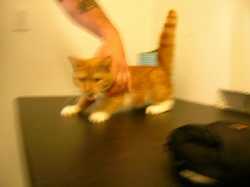
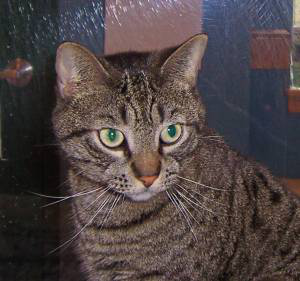
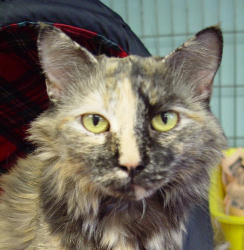
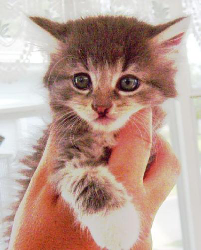
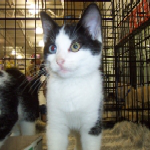
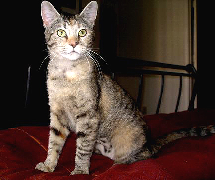
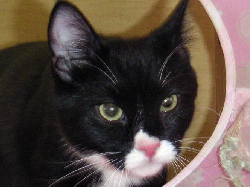
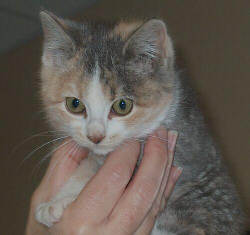
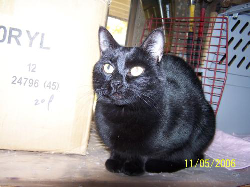
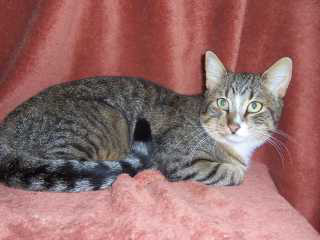

In [43]:
new_cats_dogs.head().explore()

,path,image,predictions
0,/data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/9990.jpg,,dog
1,/data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/9991.jpg,,dog
2,/data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/9992.jpg,,dog
3,/data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/9993.jpg,,dog
4,/data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/9994.jpg,,dog
5,/data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/9995.jpg,,dog
6,/data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/9996.jpg,,dog
7,/data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/9997.jpg,,dog
8,/data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/9998.jpg,,dog
9,/data/work_dir/enlik/GitRepo/30daysofdatascience/week1_beyond_pandas/data/PetImages/Dog/9999.jpg,,dog

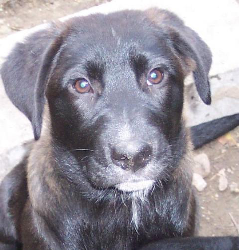
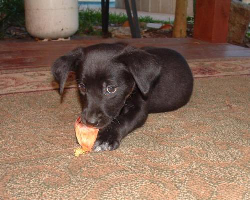
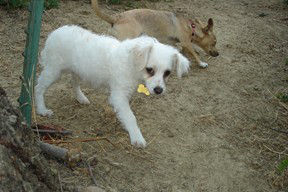
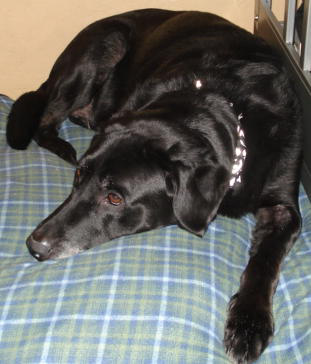
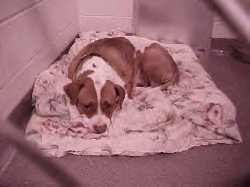
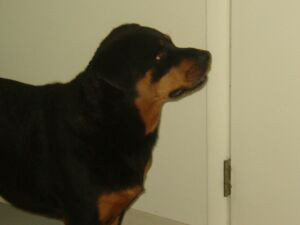
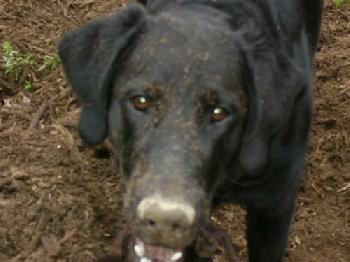
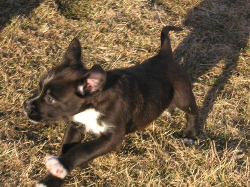
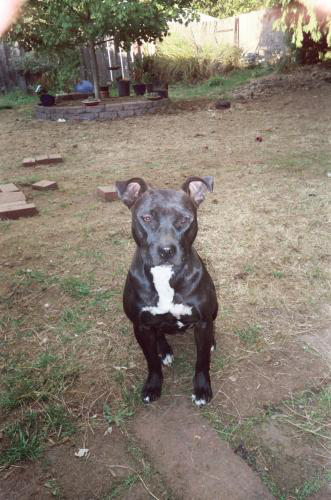
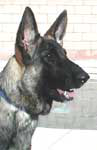

In [42]:
new_cats_dogs.tail().explore()